<a href="https://colab.research.google.com/github/Rajesh1215/Breast_cancer_detection_tensorflow/blob/main/Medical.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [5]:
!kaggle datasets download -d paultimothymooney/breast-histopathology-images

 99% 3.08G/3.10G [00:26<00:00, 213MB/s]
100% 3.10G/3.10G [00:26<00:00, 125MB/s]


In [6]:
import zipfile
zip_ref = zipfile.ZipFile('/content/breast-histopathology-images.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

In [7]:
import tensorflow as tf
from tensorflow import keras
from keras import layers, models,Sequential
from keras.layers import Dense,MaxPool2D,Flatten,Conv2D,Input,MaxPooling2D,BatchNormalization,Dropout
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os

# Specify the directory path you want to examine



In [8]:
directory_path = '/content/IDC_regular_ps50_idx5'  # Replace with your specific path

# Get a list of all directories in the specified path
directories = [d for d in os.listdir(directory_path) if os.path.isdir(os.path.join(directory_path, d))]

# Print the list of directories
# print("List of directories:")
# for directory in directories:
#     print(directory)
len(directories)

279

In [25]:
import tensorflow as tf
import os

# Directory path containing subdirectories
directory_path = '/content/IDC_regular_ps50_idx5'  # Replace with your specific path

# Get a list of all directories (subdirectories) within the specified path
subdirectories = [d for d in os.listdir(directory_path) if os.path.isdir(os.path.join(directory_path, d))]

# Create an empty list to store datasets
datasets = []

# Iterate through subdirectories
for subdir in subdirectories:
    subdir_path = os.path.join(directory_path, subdir)

    # Use image_dataset_from_directory to create a labeled dataset
    dataset = tf.keras.utils.image_dataset_from_directory(
        directory=subdir_path,
        labels="inferred",
        label_mode="int",
        class_names=None,
        color_mode="rgb",
        batch_size=32,  # You can adjust the batch size
        image_size=(256, 256),  # Adjust image size as needed
        shuffle=True,
    )

    # Assign labels based on folder names

    # Append the dataset to the list
    datasets.append(dataset)

# Now, 'datasets' is a list of datasets, each containing images and labels for each subdirectory.


Found 219 files belonging to 2 classes.
Found 797 files belonging to 2 classes.
Found 834 files belonging to 2 classes.
Found 1680 files belonging to 2 classes.
Found 465 files belonging to 2 classes.
Found 1127 files belonging to 2 classes.
Found 355 files belonging to 2 classes.
Found 808 files belonging to 2 classes.
Found 1138 files belonging to 2 classes.
Found 227 files belonging to 2 classes.
Found 808 files belonging to 2 classes.
Found 861 files belonging to 2 classes.
Found 1290 files belonging to 2 classes.
Found 761 files belonging to 2 classes.
Found 614 files belonging to 2 classes.
Found 1478 files belonging to 2 classes.
Found 1097 files belonging to 2 classes.
Found 1172 files belonging to 2 classes.
Found 1185 files belonging to 2 classes.
Found 848 files belonging to 2 classes.
Found 1361 files belonging to 2 classes.
Found 1171 files belonging to 2 classes.
Found 1907 files belonging to 2 classes.
Found 1541 files belonging to 2 classes.
Found 1112 files belonging t

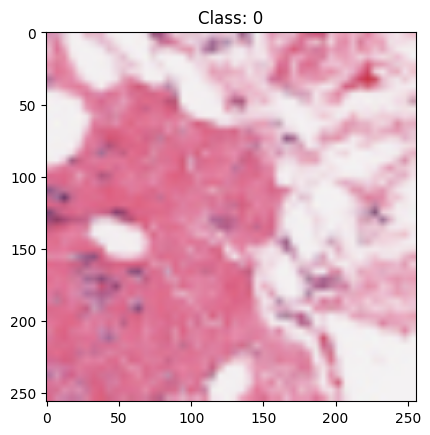

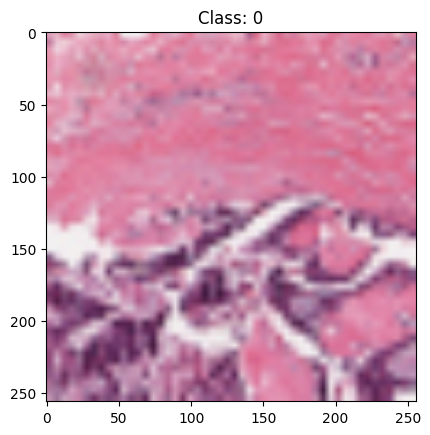

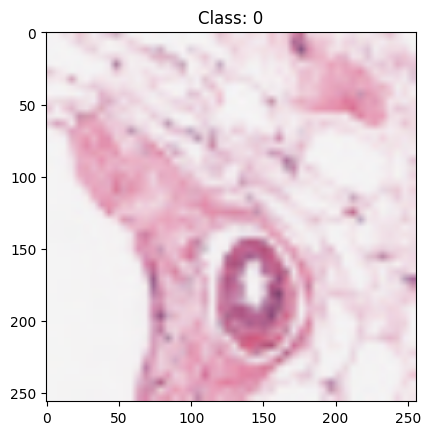

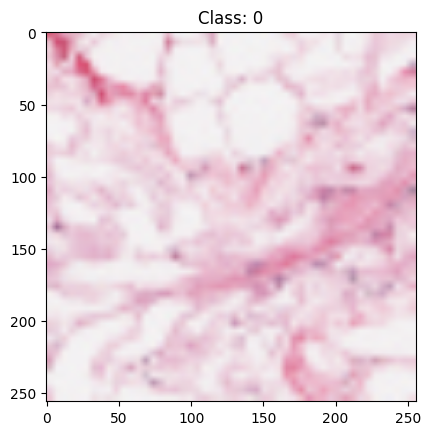

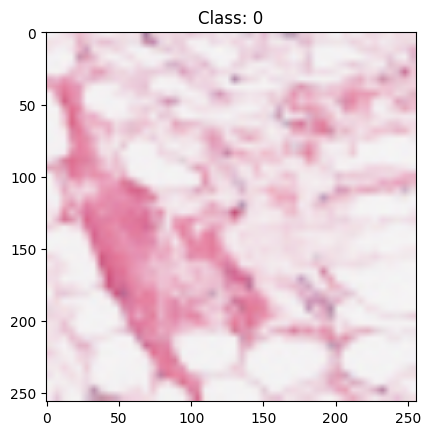

...

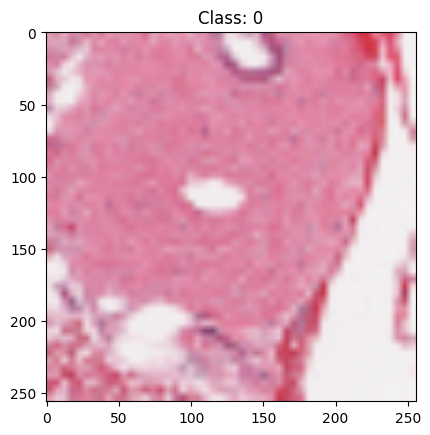

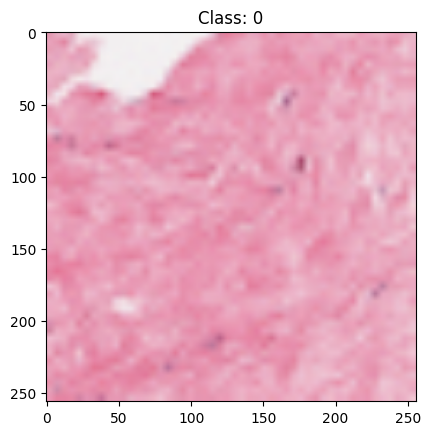

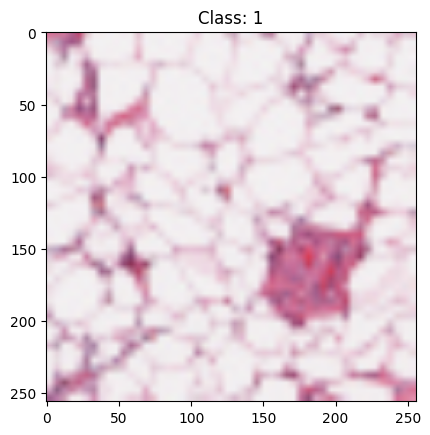

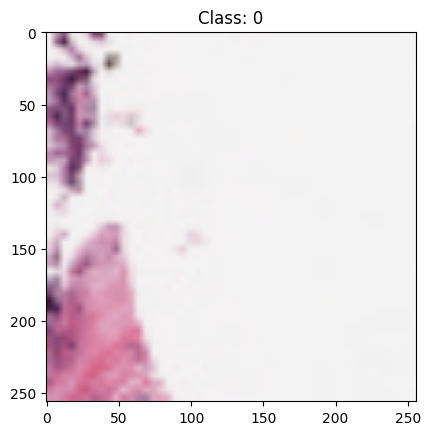

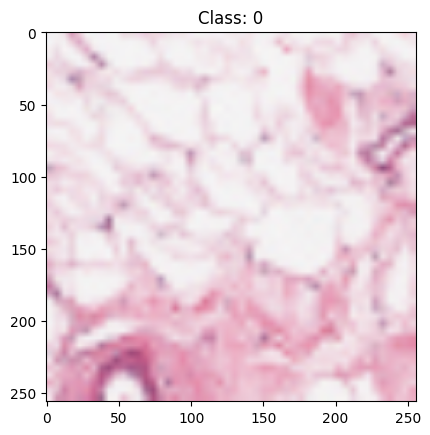

In [29]:
import matplotlib.pyplot as plt

# Get the first dataset
first_dataset = datasets[0]

# Take a specified number of batches (let's say 2 for example)
num_batches_to_display = 2
taken_dataset = first_dataset.take(num_batches_to_display)

# Iterate through the batches and display images
for images, labels in taken_dataset:
    # Iterate through images in the batch
    for i in range(len(images)):
        image = images[i].numpy().astype("uint8")  # Convert to uint8 for displaying with matplotlib
        label = labels[i].numpy()

        # Display the image
        plt.imshow(image)
        plt.title(f"Class: {label}")
        plt.show()


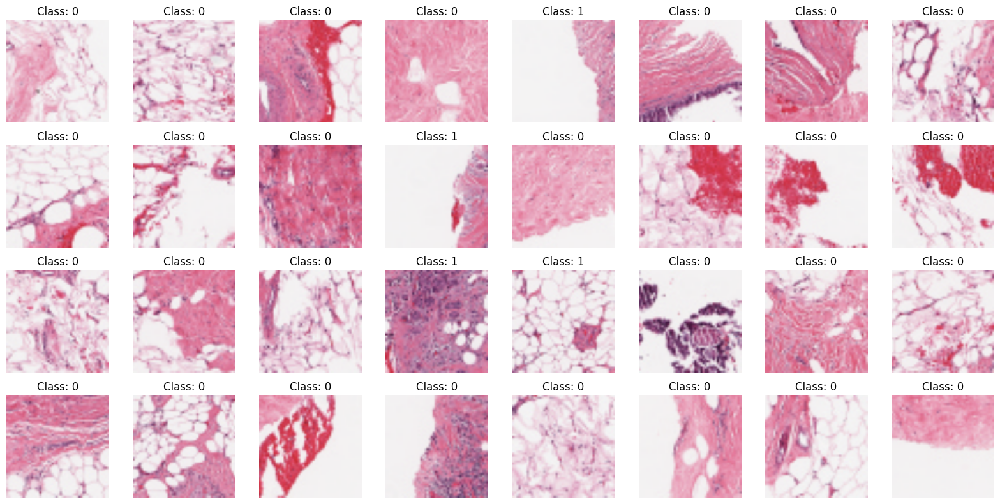

In [31]:
import matplotlib.pyplot as plt

# Get the first dataset
first_dataset = datasets[0]

# Take a specified number of batches (let's say 1 for simplicity)
num_batches_to_display = 1
taken_dataset = first_dataset.take(num_batches_to_display)

# Create a larger figure
fig, axs = plt.subplots(4, 8, figsize=(16, 8))  # Adjust the figsize as needed

# Flatten the subplots array for easier indexing
axs = axs.flatten()

# Iterate through the batches and display images
for batch_num, (images, labels) in enumerate(taken_dataset):
    # Iterate through images in the batch
    for i in range(min(len(images), len(axs))):
        image = images[i].numpy().astype("uint8")  # Convert to uint8 for displaying with matplotlib
        label = labels[i].numpy()

        # Plot the image in the subplot
        axs[i].imshow(image)
        axs[i].set_title(f"Class: {label}")
        axs[i].axis("off")  # Turn off axis labels for clarity

# Adjust layout to prevent clipping of titles
plt.tight_layout()
plt.show()


In [33]:
my_model = tf.keras.models.load_model('/content/drive/MyDrive/Colab_Notebooks/breast_cnacer_detector.h5')


1/1 [==============================] - 0s 31ms/step


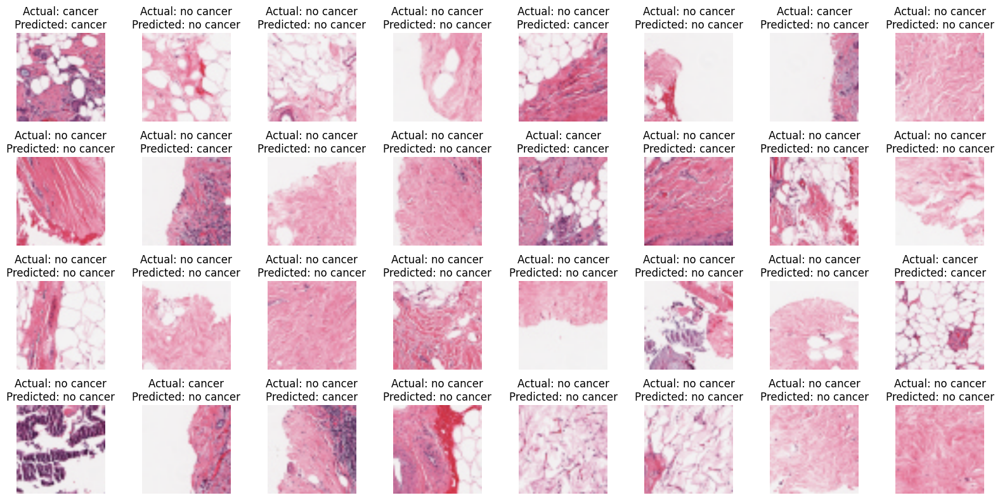

In [66]:
# Assuming dataset[0] is the dataset you want to make predictions on
dataset_to_predict = datasets[0]

# Take a specified number of batches (let's say 1 for simplicity)
num_batches_to_predict = 1
dataset_to_predict = dataset_to_predict.take(num_batches_to_predict)

# Create a larger figure
fig, axs = plt.subplots(4, 8, figsize=(16, 8))  # Adjust the figsize as needed

# Flatten the subplots array for easier indexing
axs = axs.flatten()

# Iterate through the batches and make predictions
for batch_num, (images, labels) in enumerate(dataset_to_predict):
    # Make predictions using the loaded model
    predictions = my_model.predict(images)

    # Iterate through images in the batch
    for i in range(min(len(images), len(axs))):
        image = images[i].numpy().astype("uint8")  # Convert to uint8 for displaying with matplotlib
        label = labels[i].numpy()
        predicted_label = tf.argmax(predictions[i]).numpy()
        res='cancer' if predictions[i]>0.45 else 'no cancer'
        label_text='cancer' if label ==1 else 'no cancer'
        # Plot the image in the subplot
        axs[i].imshow(image)
        axs[i].set_title(f"Actual: {label_text}\nPredicted: {res}")
        axs[i].axis("off")  # Turn off axis labels for clarity

# Adjust layout to prevent clipping of titles
plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 35ms/step


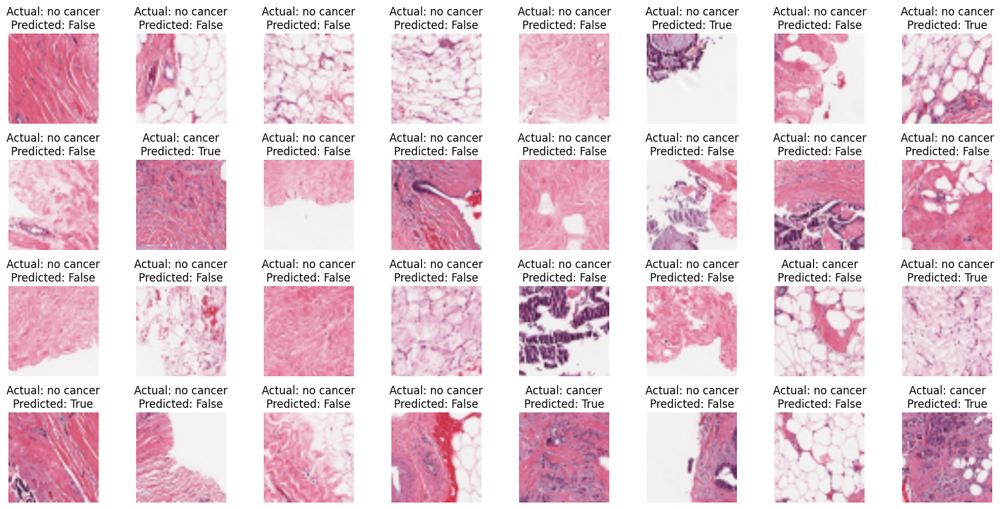

In [60]:
fig, axs = plt.subplots(4, 8, figsize=(16, 8))  # Adjust the figsize as needed

# Flatten the subplots array for easier indexing
axs = axs.flatten()
# Iterate through the batches and make predictions
for batch_num, (images, labels) in enumerate(dataset_to_predict):
    # Make predictions using the loaded model
    predictions = my_model.predict(images)

    # Iterate through images in the batch
    for i in range(min(len(images), len(axs))):
        image = images[i].numpy().astype("uint8")  # Convert to uint8 for displaying with matplotlib
        label = labels[i].numpy()
        predicted_label = tf.argmax(predictions[i]).numpy()
        res=predictions[i]>0.45
        label_text='cancer' if label ==1 else 'no cancer'
        # Plot the image in the subplot
        axs[i].imshow(image)
        axs[i].set_title(f"Actual: {label_text}\nPredicted: {res[0]}")
        axs[i].axis("off")  # Turn off axis labels for clarity

# Adjust layout to prevent clipping of titles
plt.tight_layout()
plt.show()

In [50]:
for x,z in datasets[0].take(10):
  print(z)

tf.Tensor([0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0], shape=(32,), dtype=int32)
tf.Tensor([0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1], shape=(32,), dtype=int32)
tf.Tensor([0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0], shape=(32,), dtype=int32)
tf.Tensor([0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1], shape=(32,), dtype=int32)
tf.Tensor([0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0], shape=(32,), dtype=int32)
tf.Tensor([1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0], shape=(32,), dtype=int32)
tf.Tensor([0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0], shape=(27,), dtype=int32)


In [11]:
for i in datasets:
  print(i)


<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), 

In [12]:
import os

def count_files_in_directory(directory):
    file_count = 0
    for root, _, files in os.walk(directory):
        file_count += len(files)
    return file_count

directory_path = '/content/12891/1'  # Replace with the actual path to the "12891" folder
total_files = count_files_in_directory(directory_path)

print(f"Total number of files in '{directory_path}' and its subfolders: {total_files}")


Total number of files in '/content/12891/1' and its subfolders: 172


In [13]:
subdirectories

['9174',
 '12909',
 '9073',
 '12895',
 '9124',
 '16896',
 '13617',
 '12949',
 '12951',
 '13023',
 '12901',
 '9081',
 '16166',
 '13025',
 '12891',
 '14157',
 '12242',
 '9254',
 '9345',
 '10254',
 '9346',
 '9266',
 '10302',
 '8918',
 '9037',
 '10277',
 '9321',
 '12906',
 '9319',
 '9036',
 '9290',
 '12896',
 '10291',
 '9382',
 '12752',
 '12931',
 '15902',
 '16553',
 '12241',
 '14155',
 '15840',
 '9260',
 '16570',
 '14078',
 '12875',
 '10290',
 '10308',
 '16895',
 '13613',
 '12880',
 '10256',
 '16552',
 '8917',
 '9043',
 '15839',
 '15634',
 '15632',
 '10285',
 '15472',
 '10307',
 '14210',
 '10292',
 '13018',
 '16568',
 '14209',
 '14188',
 '9178',
 '16085',
 '15473',
 '9135',
 '13400',
 '12821',
 '12749',
 '8916',
 '9320',
 '12934',
 '12876',
 '8913',
 '12898',
 '15512',
 '12894',
 '13693',
 '10288',
 '16167',
 '16569',
 '12751',
 '9291',
 '12819',
 '16533',
 '10255',
 '10273',
 '10257',
 '10261',
 '12879',
 '15515',
 '9029',
 '9076',
 '10304',
 '8957',
 '12955',
 '14306',
 '12750',
 '10272

In [14]:
positive_count = 0
negative_count = 0

for batch in datasets[0]:
    labels = batch[1]

    # Count the number of positive (1) and negative (0) labels in the batch
    positive_count += tf.reduce_sum(tf.cast(labels == 1, tf.int32))
    negative_count += tf.reduce_sum(tf.cast(labels == 0, tf.int32))

print(f"Number of Positive Examples: {positive_count.numpy()}")
print(f"Number of Negative Examples: {negative_count.numpy()}")


Number of Positive Examples: 29
Number of Negative Examples: 190


In [15]:
combined_dataset = datasets[0]
for dataset in datasets[1:]:
    combined_dataset = combined_dataset.concatenate(dataset)


In [16]:
for i in combined_dataset.take(1):
  print(i[1])

tf.Tensor([0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1], shape=(32,), dtype=int32)


In [ ]:
model = Sequential([
    Conv2D(32, kernel_size=3, input_shape=(256, 256, 3), activation='relu'),
    MaxPooling2D(pool_size=2),
    BatchNormalization(),
    Conv2D(64, kernel_size=3, activation='relu'),
    MaxPooling2D(pool_size=2),
    BatchNormalization(),
    Conv2D(128, kernel_size=3, activation='relu'),
    MaxPooling2D(pool_size=2),
    BatchNormalization(),
    Conv2D(256, kernel_size=3, activation='relu'),
    MaxPooling2D(pool_size=2),
    BatchNormalization(),
    Conv2D(512, kernel_size=3, activation='relu'),
    MaxPooling2D(pool_size=2),
    BatchNormalization(),
    Conv2D(512, kernel_size=3, activation='relu'),
    MaxPooling2D(pool_size=2),
    BatchNormalization(),
    Flatten(),
    Dense(1024,activation="relu"),
    Dense(512,activation="relu"),
    Dense(256,activation="relu"),
    Dense(128,activation="relu"),
    Dense(64,activation="relu"),
    Dense(32,activation="relu"),
    Dense(16,activation="relu"),
    Dense(1,activation="sigmoid"),
])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 32)      0         
 D)                                                              
                                                                 
 batch_normalization (Batch  (None, 127, 127, 32)      128       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                        

In [ ]:
train_dataset = combined_dataset.skip(int(0.7 * len(combined_dataset)))  # Use 10% for validation
validation_dataset = combined_dataset.take(int(0.1 * len(combined_dataset)))

# history = model.fit(train_dataset, epochs=5, validation_data=validation_dataset)


In [ ]:
from tensorflow.keras.applications import VGG16

# Load the pre-trained VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Set the layers of the pre-trained model as non-trainable
for layer in base_model.layers:
    layer.trainable = False

# Create your custom classification layers on top
top_model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=base_model.output_shape[1:]),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1, activation='sigmoid')  # Binary classification
])

# Combine the base model and the custom top layer
model2 = tf.keras.Sequential([base_model, top_model])

# Compile the model
model2.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])


58889256/58889256 [==============================] - 2s 0us/step


In [ ]:
history2=model2.fit(train_dataset, epochs=2, validation_data=validation_dataset)

Epoch 1/2
2642/2642 [==============================] - 746s 209ms/step - loss: 0.4175 - accuracy: 0.7359 - val_loss: 0.4568 - val_accuracy: 0.6579
Epoch 2/2


In [ ]:
model2.save("breast_cnacer_detector.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout

# Load the ResNet50 model with pre-trained weights, excluding the top classification layers
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom classification layers on top of the ResNet50 feature extractor
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(1, activation='sigmoid')(x)  # Binary classification

# Create the custom model
custom_model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
custom_model.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=['accuracy'])

# Print model summary
custom_model.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_3[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                        

In [ ]:
history3=custom_model.fit(train_dataset, epochs=5, validation_data=validation_dataset)

Epoch 1/5
2642/2642 [==============================] - 619s 172ms/step - loss: 0.3154 - accuracy: 0.8744 - val_loss: 0.4535 - val_accuracy: 0.8217
Epoch 2/5
2642/2642 [==============================] - 580s 160ms/step - loss: 0.3042 - accuracy: 0.8768 - val_loss: 0.4481 - val_accuracy: 0.8209
Epoch 3/5
2642/2642 [==============================] - 621s 176ms/step - loss: 0.3022 - accuracy: 0.8793 - val_loss: 0.4539 - val_accuracy: 0.8242
Epoch 4/5
2642/2642 [==============================] - 624s 176ms/step - loss: 0.2959 - accuracy: 0.8800 - val_loss: 0.4506 - val_accuracy: 0.8269
Epoch 5/5
2642/2642 [==============================] - 576s 159ms/step - loss: 0.2925 - accuracy: 0.8774 - val_loss: 0.4323 - val_accuracy: 0.8285


In [ ]:
import matplotlib.pyplot as plt

def plot_training_history(history, label):
    # Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model Accuracy - ' + label)
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

    # Plot training & validation loss values
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss - ' + label)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

# Assuming history, history2, and history3 are available
plot_training_history(history, "History 1")
plot_training_history(history2, "History 2")
plot_training_history(history3, "History 3")


In [19]:
my_model = tf.keras.models.load_model('/content/drive/MyDrive/Colab_Notebooks/breast_cnacer_detector.h5')


In [20]:
my_model